In [1]:
import os 

In [2]:
os.getcwd()

'/home/yehudan'

In [3]:
os.chdir('/home/yehudan/Desktop/DecisionTree/DecisionTree')

In [4]:
os.getcwd()

'/home/yehudan/Desktop/DecisionTree/DecisionTree'

In [5]:
import Trees
import time
from sklearn.model_selection import train_test_split
import numpy as np
import pandas as pd
from sklearn.datasets import make_regression
from sklearn.metrics import mean_squared_error
import matplotlib.pyplot as plt
from sklearn.model_selection import KFold
from sklearn.model_selection import LeaveOneOut
import numpy as np
import pandas as pd
import time
from tqdm import tqdm
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
import matplotlib.pyplot as plt
plt.rcParams["figure.figsize"] = (5,5)

lglgl


#### Functions using to predict 

## pruning (for my implementation)

In [6]:
def prune(model, X, y, maximum_depth=4, cv = KFold(n_splits=5)):
    if isinstance(X, pd.DataFrame):
        X = X.to_numpy()
    if isinstance(y, pd.DataFrame):
        y = y.to_numpy()
    lst_mse = []
    # TODO: how to select max_depth
    for max_depth in range(1, maximum_depth+1):
        mse_max_depth_i = 0
#         DT = Trees.CartDecisionTreeRegressor(max_depth=max_depth)
        DT = model(max_depth=max_depth)
        for train_index, test_index in cv.split(X):
            X_train, x_test = pd.DataFrame(X[train_index]), X[test_index]
            y_train, y_test = pd.DataFrame(y[train_index]), y[test_index]
            DT.fit(X_train, y_train)
            y_hat = DT.predict(x_test)
            mse_max_depth_i += mean_squared_error(y_test, y_hat)
        mse_max_depth_i = np.mean(mse_max_depth_i)
        lst_mse.append(mse_max_depth_i)

#     plt.plot(range(1, maximum_depth+1), lst_mse)

#     # naming the x axis
#     plt.xlabel('max depth')
#     # naming the y axis
#     plt.ylabel('MSE')

#     # giving a title to my graph
#     plt.title('MSE vs max depth')

#     # function to show the plot
#     plt.show()
    return np.argmin(lst_mse) + 1

#### Functions using to predict 

In [7]:
def predict_cut_only_for_all(X_train, X_test, Y_train, Y_test):
    max_depth = prune(Trees.CartDecisionTreeRegressor,X_train, Y_train)
    regressor_only_for_all = Trees.CartDecisionTreeRegressor(max_depth=max_depth)
    regressor_only_for_all.fit(X_train, Y_train)
    result_only_for_all = regressor_only_for_all.predict(X_test)
    return result_only_for_all


def predict_cut_only_for_individual(X_train, X_test, Y_train, Y_test):
    result_only_for_individual = list()
    for i in range(Y_train.shape[1]):
        y_i = Y_train[i]  # Take only y_i
#         print('pruning for individual')
        max_depth = prune(Trees.CartDecisionTreeRegressor,X_train, y_i)
        regressor_only_for_individual = Trees.CartDecisionTreeRegressor(max_depth=max_depth)
        regressor_only_for_individual.fit(X_train, y_i)
        predict_yi = regressor_only_for_individual.predict(X_test)
        predict_yi = [item for sublist in predict_yi for item in sublist]  # create flat list
        result_only_for_individual.append(predict_yi)
    result_only_for_individual = np.array(result_only_for_individual)
    result_only_for_individual = np.transpose(result_only_for_individual)
    return result_only_for_individual


def predict_LOO(X_train, X_test, Y_train, Y_test, cv=KFold(n_splits=10)): # High max depth- used to stop when score decreas
    max_depth = prune(Trees.LooDecisionTreeRegressor,X_train, Y_train)
    regressor_LOO = Trees.LooDecisionTreeRegressor(max_depth=max_depth, cv=cv)
    regressor_LOO.fit(X_train, Y_train)
    regressor_LOO.print_tree()
    result_LOO = regressor_LOO.predict(X_test)
    return result_LOO

In [8]:
def create_y(X, alpha):
    y = []
    for row in X:
        if row[0] > alpha[0]:
            if row[1] > alpha[1]:
                y.append(0)
            else:
                y.append(1)
        else:
            if row[1] > alpha[2]:
                y.append(2)
            else:
                y.append(3)

    return np.array(y).reshape(X.shape[0], -1)

In [9]:
def create_X_y_corr(n_samples, alpha: list, sd=1, seed=0):  # Create X with 2 columns and y with 2 columns
    np.random.seed(seed)
    x_1_2 = np.random.uniform(-10, 10, (n_samples, 2))
    noise_1 = np.random.normal(0, sd, (n_samples, 1))
    np.random.seed(seed + 1)
    noise_2 = np.random.normal(0, sd, (n_samples, 1))
    y_1 = create_y(x_1_2, alpha=[0, 0, 0]) + noise_1
    y_2 = create_y(x_1_2, alpha=alpha) + noise_2
    y = np.c_[y_1, y_2]
    return x_1_2, y

#### MSE depnding on correlation function (for each 3 models)

In [10]:
def mse_depnding_on_correlation(range_alpha, n_samples, sd, n_iter=50, cv=KFold(n_splits=10), n_features=1,
                                n_targets=2):
    mse_for_all_mean = []
    mse_for_individual_mean = []
    mse_Loo_mean = []

    for alpha in tqdm(range_alpha, desc = 'alphas Progress Bar'):
        print('alpha',alpha)
        #         print('**********************************************************')
        #         print('alpha= ', alpha)
        mse_for_all, mse_for_individual, mse_LOO = list(), list(), list()
        for iteration in range(n_iter):
            print('iteration',iteration)
            X, y = create_X_y_corr(n_samples=n_samples, alpha=alpha, seed=iteration * 2, sd=sd)
            X_train, X_test, Y_train, Y_test = train_test_split(X, y, test_size=0.2, random_state=iteration * 3)
            X_train, Y_train = pd.DataFrame(X_train), pd.DataFrame(Y_train)

            # Predict only for all
            result_only_for_all = predict_cut_only_for_all(X_train, X_test, Y_train, Y_test)
            mse_for_all.append(mean_squared_error(Y_test, result_only_for_all))

            # Predict only for individual
            result_only_for_individual = predict_cut_only_for_individual(X_train, X_test, Y_train, Y_test)
            mse_for_individual.append(mean_squared_error(Y_test, result_only_for_individual))

            # predict using LOO
            result_LOO = predict_LOO(X_train, X_test, Y_train, Y_test, cv=cv)
            mse_LOO.append(mean_squared_error(Y_test, result_LOO))

        mse_for_all_mean.append(np.mean(mse_for_all))
        print(f'mse_for_all_mean={mse_for_all_mean}')
        mse_for_individual_mean.append(np.mean(mse_for_individual))
        print(f'mse_for_individual_mean={mse_for_individual_mean}')
        mse_Loo_mean.append(np.mean(mse_LOO))
        print(f'mse_Loo_mean={mse_Loo_mean}')

    return mse_for_all_mean, mse_for_individual_mean, mse_Loo_mean

#### Plot function  

In [11]:
def plot_dependencies(x_variable: range, mse_for_all: list, mse_for_individual: list, mse_LOO, x_label_text: str):
    fig, ax = plt.subplots()
    plt.figure(figsize=(6, 6))
#     plt.style.use(['science', 'no-latex'])

    # alpha_as_strings = [str(alpha) for alpha in x_variable]
    # plt.xticks(np.arange(len(x_variable)), alpha_as_strings)

    x_values = [alphas[0]for alphas in  x_variable]

    ax.plot(x_values, mse_for_all, linestyle='dashed', markersize=0.7, label="MT")
    ax.plot(x_values, mse_for_individual, linestyle='dashed', markersize=0.7, label='ST')
    ax.plot(x_values, mse_LOO, linestyle='dashed', markersize=0.7, label='Suggested method')

    ax.set_title('MSE as funcction of {}'.format(x_label_text))
    ax.legend()
    ax.xaxis.set_label_text(x_label_text)
    ax.yaxis.set_label_text('MSE')
    ax.grid()



In [12]:
def create_alpha_lists(step, max_alpha=2, num_alpha=3):
    lst_alpha = []
    # for i in range(num_alpha - 1, -1, -1):
    #     lst = [0, 0, 0]
    #     for alpha_i in np.arange(0, max_alpha + step, step):
    #         # print(alpha_i)
    #         lst[i] = alpha_i
    #         lst_alpha.append(lst[:])
    for i in np.arange(0, max_alpha + step, step):
        lst = [i] * num_alpha
        lst_alpha.append(lst[:])
    return lst_alpha

# -----------------------------------------------------------------------------------------------------------

In [16]:
range_alpha = create_alpha_lists(step=0.05, max_alpha=0.4)

In [17]:
len(range_alpha)

9

In [18]:
start_time = time.time()
mse_for_all, mse_for_individual, mse_LOO = mse_depnding_on_correlation(range_alpha=range_alpha, n_samples=600, 
                                                                       n_iter=500,
                                                                       sd=1)


alphas Progress Bar:   0%|          | 0/9 [00:00<?, ?it/s]

alpha [0.0, 0.0, 0.0]
iteration 0
************************************************************sub tree number 0 ************************************************************
Root
depth=0| Split rule- x_i to split:0, value to split:-0.201
   | Impurity of the node: 1027.44
   | Impurity of the best split: 534.96
   | Count of observations in node: 480
   |LOO score: 551.0683931286219
depth=1|-------- Split rule- x_i to split:1, value to split:0.419
           | Impurity of the node: 276.58
           | Impurity of the best split: 205.96
           | Count of observations in node: 238
           |LOO score: 212.98038854359206
depth=2   leaf node                       | Count of observations in node: 136
                                          | Prediction of node: [3.099]
                                          | Impurity of the node: 120.24
Leaf id: 2
                                          | Loo score: 122.534
depth=2   leaf node                       | Count of observations in no

alphas Progress Bar:  11%|█         | 1/9 [6:39:45<53:18:01, 23985.24s/it]

Root
depth=0| Split rule- x_i to split:0, value to split:-0.039
   | Impurity of the node: 2348.48
   | Impurity of the best split: 1266.98
   | Count of observations in node: 480
   |LOO score: 1284.7767811608621
************************************************************sub tree number 0 ************************************************************
Root
depth=0| Split rule- x_i to split:1, value to split:0.093
   | Impurity of the node: 304.06
   | Impurity of the best split: 235.06
   | Count of observations in node: 249
   |LOO score: 238.9089869780373
depth=1   leaf node               | Count of observations in node: 134
                                  | Prediction of node: [3.091]
                                  | Impurity of the node: 123.17
Leaf id: 2
                                  | Loo score: 136.884
depth=1   leaf node               | Count of observations in node: 115
                                  | Prediction of node: [2.035]
                                  | 

alphas Progress Bar:  22%|██▏       | 2/9 [13:12:49<46:10:44, 23749.24s/it]

************************************************************sub tree number 0 ************************************************************
Root
depth=0| Split rule- x_i to split:0, value to split:-0.039
   | Impurity of the node: 1179.64
   | Impurity of the best split: 626.43
   | Count of observations in node: 480
   |LOO score: 646.5447975337452
depth=1|-------- Split rule- x_i to split:1, value to split:0.093
           | Impurity of the node: 304.06
           | Impurity of the best split: 235.06
           | Count of observations in node: 249
           |LOO score: 238.9089869780373
depth=2   leaf node                       | Count of observations in node: 134
                                          | Prediction of node: [3.091]
                                          | Impurity of the node: 123.17
Leaf id: 2
                                          | Loo score: 136.884
depth=2   leaf node                       | Count of observations in node: 115
                           

alphas Progress Bar:  33%|███▎      | 3/9 [19:37:30<39:04:25, 23444.30s/it]

************************************************************sub tree number 0 ************************************************************
Root
depth=0| Split rule- x_i to split:0, value to split:-0.039
   | Impurity of the node: 1179.64
   | Impurity of the best split: 626.43
   | Count of observations in node: 480
   |LOO score: 646.5447975337452
depth=1|-------- Split rule- x_i to split:1, value to split:0.093
           | Impurity of the node: 304.06
           | Impurity of the best split: 235.06
           | Count of observations in node: 249
           |LOO score: 238.9089869780373
depth=2   leaf node                       | Count of observations in node: 134
                                          | Prediction of node: [3.091]
                                          | Impurity of the node: 123.17
Leaf id: 2
                                          | Loo score: 136.884
depth=2   leaf node                       | Count of observations in node: 115
                           

alphas Progress Bar:  44%|████▍     | 4/9 [25:55:55<32:09:22, 23152.42s/it]

************************************************************sub tree number 0 ************************************************************
Root
depth=0| Split rule- x_i to split:0, value to split:-0.039
   | Impurity of the node: 1179.64
   | Impurity of the best split: 626.43
   | Count of observations in node: 480
   |LOO score: 646.5447975337452
depth=1|-------- Split rule- x_i to split:1, value to split:0.093
           | Impurity of the node: 304.06
           | Impurity of the best split: 235.06
           | Count of observations in node: 249
           |LOO score: 238.9089869780373
depth=2   leaf node                       | Count of observations in node: 134
                                          | Prediction of node: [3.091]
                                          | Impurity of the node: 123.17
Leaf id: 2
                                          | Loo score: 136.884
depth=2   leaf node                       | Count of observations in node: 115
                           

alphas Progress Bar:  56%|█████▌    | 5/9 [32:07:38<25:23:04, 22846.09s/it]

************************************************************sub tree number 0 ************************************************************
Root
depth=0| Split rule- x_i to split:0, value to split:-0.039
   | Impurity of the node: 1179.64
   | Impurity of the best split: 626.43
   | Count of observations in node: 480
   |LOO score: 646.5447975337452
depth=1|-------- Split rule- x_i to split:1, value to split:0.093
           | Impurity of the node: 304.06
           | Impurity of the best split: 235.06
           | Count of observations in node: 249
           |LOO score: 238.9089869780373
depth=2   leaf node                       | Count of observations in node: 134
                                          | Prediction of node: [3.091]
                                          | Impurity of the node: 123.17
Leaf id: 2
                                          | Loo score: 136.884
depth=2   leaf node                       | Count of observations in node: 115
                           

alphas Progress Bar:  67%|██████▋   | 6/9 [38:12:22<18:45:57, 22519.08s/it]

************************************************************sub tree number 0 ************************************************************
Root
depth=0| Split rule- x_i to split:0, value to split:-0.039
   | Impurity of the node: 1179.64
   | Impurity of the best split: 626.43
   | Count of observations in node: 480
   |LOO score: 646.5447975337452
depth=1|-------- Split rule- x_i to split:1, value to split:0.093
           | Impurity of the node: 304.06
           | Impurity of the best split: 235.06
           | Count of observations in node: 249
           |LOO score: 238.9089869780373
depth=2   leaf node                       | Count of observations in node: 134
                                          | Prediction of node: [3.091]
                                          | Impurity of the node: 123.17
Leaf id: 2
                                          | Loo score: 136.884
depth=2   leaf node                       | Count of observations in node: 115
                           

alphas Progress Bar:  78%|███████▊  | 7/9 [44:12:22<12:20:37, 22218.55s/it]

************************************************************sub tree number 0 ************************************************************
Root
depth=0| Split rule- x_i to split:0, value to split:-0.039
   | Impurity of the node: 1179.64
   | Impurity of the best split: 626.43
   | Count of observations in node: 480
   |LOO score: 646.5447975337452
depth=1|-------- Split rule- x_i to split:1, value to split:0.093
           | Impurity of the node: 304.06
           | Impurity of the best split: 235.06
           | Count of observations in node: 249
           |LOO score: 238.9089869780373
depth=2   leaf node                       | Count of observations in node: 134
                                          | Prediction of node: [3.091]
                                          | Impurity of the node: 123.17
Leaf id: 2
                                          | Loo score: 136.884
depth=2   leaf node                       | Count of observations in node: 115
                           

alphas Progress Bar:  89%|████████▉ | 8/9 [50:10:29<6:06:25, 21985.55s/it] 

************************************************************sub tree number 0 ************************************************************
Root
depth=0| Split rule- x_i to split:0, value to split:-0.039
   | Impurity of the node: 1179.64
   | Impurity of the best split: 626.43
   | Count of observations in node: 480
   |LOO score: 646.5447975337452
depth=1|-------- Split rule- x_i to split:1, value to split:0.093
           | Impurity of the node: 304.06
           | Impurity of the best split: 235.06
           | Count of observations in node: 249
           |LOO score: 238.9089869780373
depth=2   leaf node                       | Count of observations in node: 134
                                          | Prediction of node: [3.091]
                                          | Impurity of the node: 123.17
Leaf id: 2
                                          | Loo score: 136.884
depth=2   leaf node                       | Count of observations in node: 115
                           

alphas Progress Bar: 100%|██████████| 9/9 [56:03:15<00:00, 22421.74s/it]  

************************************************************sub tree number 0 ************************************************************
Root
depth=0| Split rule- x_i to split:0, value to split:-0.039
   | Impurity of the node: 1179.64
   | Impurity of the best split: 626.43
   | Count of observations in node: 480
   |LOO score: 646.5447975337452
depth=1|-------- Split rule- x_i to split:1, value to split:0.093
           | Impurity of the node: 304.06
           | Impurity of the best split: 235.06
           | Count of observations in node: 249
           |LOO score: 238.9089869780373
depth=2   leaf node                       | Count of observations in node: 134
                                          | Prediction of node: [3.091]
                                          | Impurity of the node: 123.17
Leaf id: 2
                                          | Loo score: 136.884
depth=2   leaf node                       | Count of observations in node: 115
                           

In [19]:
mse_for_all, mse_for_individual, mse_LOO

([1.0328577549189677,
  1.03713818458216,
  1.0416431450464305,
  1.047434387395409,
  1.05501264277988,
  1.0606102174333427,
  1.0668593919864078,
  1.0732301413314258,
  1.0769543477952574],
 [1.0447201820899108,
  1.045853449437839,
  1.0454047068738228,
  1.0458197972534942,
  1.0441250893706264,
  1.0437897504192875,
  1.0453638585928853,
  1.0455144772326903,
  1.044197436502729],
 [1.0384049689721893,
  1.0413363098634876,
  1.0432565287321747,
  1.046032730858109,
  1.0462345411574334,
  1.0455425406333165,
  1.0476827807675706,
  1.0472918211177444,
  1.0467188153049878])

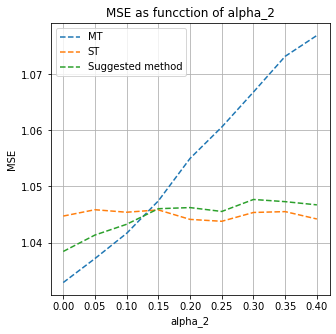

<Figure size 432x432 with 0 Axes>

--- 253401.12129569054 seconds ---


In [20]:
plot_dependencies(range_alpha, mse_for_all, mse_for_individual, mse_LOO, 'alpha_2')
plt.show()
print("--- %s seconds ---" % (time.time() - start_time))

In [ ]:
mse_for_all, mse_for_individual, mse_LOO

In [ ]:
time.sleep(60*60*24*3)

In [ ]:
for n_samples in [300,600]:
    start_time = time.time()
    mse_for_all, mse_for_individual, mse_LOO = mse_depnding_on_correlation(range_alpha=range_alpha, n_samples=n_samples, 
                                                                           n_iter=500,
                                                                           sd=1)
    plot_dependencies(range_alpha, mse_for_all, mse_for_individual, mse_LOO, 'alpha')
    plt.show()
    print("--- %s seconds ---" % (time.time() - start_time))